In [1]:
import random
import torch
from torch import nn
from torchvision import datasets
import torchvision.transforms as transforms
import pandas as pd
from torch.utils.data import DataLoader
from torch.optim import Adam, RMSprop
import numpy as np
import matplotlib as mpl
import torchvision.utils as vutils
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML
from torcheval.metrics import FrechetInceptionDistance


from wgan_models import NetD, NetG

In [2]:
if torch.cuda.is_available():
    device = 'cuda'
elif torch.backends.mps.is_available():
    device = 'mps'
else:
    device = 'cpu'
display(f'Device {device} is available.')

manual_seed = 999
torch.manual_seed(manual_seed)
random.seed(manual_seed)
#torch.use_deterministic_algorithms(True)

'Device cuda is available.'

In [3]:
G = NetG().to(device)
D = NetD().to(device)

batch_size = 64
#lr = 0.0002
lr = 0.00005
clip = 0.01
epochs = 50
n_crit=5
loss_fn = nn.BCELoss()
fixed_noise = torch.randn((64, 100, 1,1), device=device)
fixed_labels = torch.randint(0,10, (64,1)).to(device)
# Other normalization factors are located here:  https://github.com/kuangliu/pytorch-cifar/issues/19
transform = transforms.Compose([transforms.Resize(64), transforms.ToTensor(), transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))])

train_loader = DataLoader(datasets.CIFAR10(root='./hw4data', train=True, transform=transform, download=True), batch_size=batch_size,shuffle=True)
#test_loader =  DataLoader(datasets.CIFAR10(root='./hw4data', train=False, transform=transform, download=True), batch_size=batch_size,shuffle=True)

gen_optimizer = RMSprop(G.parameters(), lr=lr)
dis_optimizer = RMSprop(D.parameters(), lr=lr)

#gen_optimizer = Adam(dc_gen.parameters(), lr=lr, betas=(.5, .999))
#dis_optimizer = Adam(dc_dis.parameters(), lr=lr, betas=(.5, .999))
#dis_optimizer = SGD(dc_dis.parameters(), lr=lr) 

Files already downloaded and verified


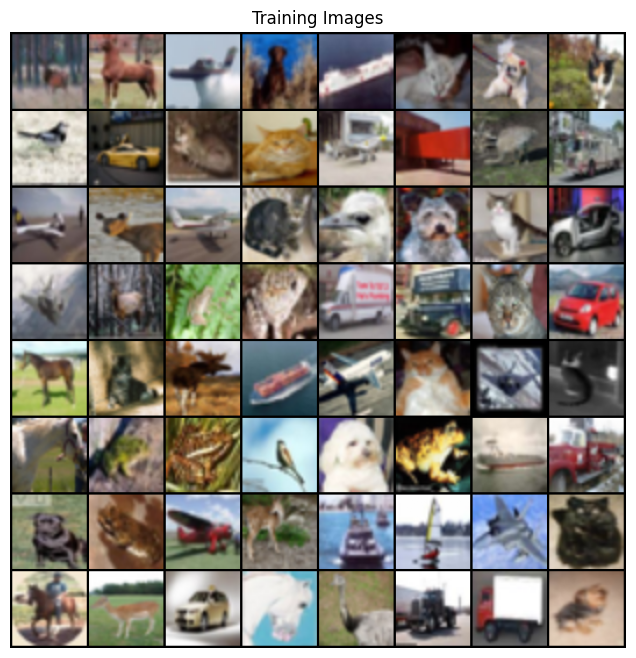

In [4]:
data = next(iter(train_loader))
data[0].shape

plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(vutils.make_grid(data[0].to(device)[:64], padding=2, normalize=True).cpu(),(1,2,0)))
plt.show()


In [5]:

def init_weights(m):
    """Adapted from https://pytorch.org/tutorials/beginner/dcgan_faces_tutorial.html. """
    clazz = m.__class__.__name__
    if clazz.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif clazz.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

G.apply(init_weights)
D.apply(init_weights)

display(G)
display(D)



NetG(
  (embedding): Embedding(10, 100)
  (sequence): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.9, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.9, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.9, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.9, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bi

NetD(
  (embedding): Embedding(10, 512)
  (sequence): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.9, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.9, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.9, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
  )
  (last_conv2d): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
  (flatten): Fla

In [10]:
def train(g, d, gen_optimizer, dis_optimizer, train_loader, epoch, clip, n_crit):
    derrors, gerrors, gen_imgs, dx, d_g_x1, d_g_x2= [],[], [], [],[], []
    
    with torch.no_grad():
        fid = FrechetInceptionDistance(device = device)    
    for idx, data in enumerate(train_loader):
        g.train()
        d.train()
        with torch.no_grad():
            fid.update((data[0]-data[0].min())/(data[0].max()-data[0].min()), is_real=True)
        #loader = cycle(train_loader)
        critic_loss =0
        for _ in range(n_crit):
            imgs = data[0].to(device)
            batch_size = imgs.size(0)
            # Real images with discriminator
            output = d(imgs, data[1].to(device))
            d_real_error = output.mean(0).view(1)
            #d_real_error = loss_fn(output.squeeze(), label)
            #d_real_error.backward()      
            dx.append(output.mean().item())

            # Fake images with discriminator
            zvector = torch.randn((batch_size, 100, 1, 1), device=device)
            fakes = g(zvector, data[1].to(device))
            output = d(fakes.detach(), data[1].to(device))
            d_fake_error = output.mean(0).view(1)
            #d_fake_error.backward()
            d_g_x1.append(output.mean().item())    

            total_error = (d_fake_error - d_real_error)
            critic_loss+=total_error
            #total_error.backward(retain_graph=True)
        critic_loss.backward(retain_graph=True)    
        dis_optimizer.step()
        d.zero_grad()
        for params in d.parameters():
            params.data.clamp_(-clip, clip)

                #total_Derror = d_fake_error + d_real_error
                #total_Derror.backward()
                #derrors.append(total_Derror.item())
        derrors.append(critic_loss.item()/n_crit)        
        

        batch_size = data[0].size(0)
        # Do the loss of G
        g.zero_grad()
        #fakes = g(zvector)
        zvector = torch.randn((batch_size, 100, 1, 1), device=device)
        fakes = g(zvector, data[1].to(device))
        output = d(fakes, data[1].to(device))
        g_error = output.mean(0).view(1)
        g_error = -g_error
        gerrors.append(g_error.item())
        g_error.backward()
        gen_optimizer.step()
    
        #output = d(fakes, data[1].to(device))
        #g_error = loss_fn(output.squeeze(), trick_label)
        #gerrors.append(g_error.item())
        #print(g_error)
        #g_error.backward()
        #gen_optimizer.step()
        #d_g_x2.append(output.mean().item())

        if idx == (len(train_loader) -1) and (epoch+1) % 5 == 0:
            with torch.no_grad():
                g.eval()
                #torch.randint(0,10, (64,1)).to(device).detach().cpu()
                extra_fake = g(fixed_noise, fixed_labels) #data[1].to(device)).detach().cpu()
                gen_imgs.append(vutils.make_grid(extra_fake, padding=2, normalize=True))

                fig = plt.figure(figsize=(8,8))
                plt.axis("off")
                plt.imshow(np.transpose(vutils.make_grid(fakes, padding=2, normalize=True).cpu(), (2,1,0)))
                plt.show()
                plt.close(fig)
        
        if idx == (len(train_loader) -1):
            with torch.no_grad():
                fid.update((fakes-fakes.min())/(fakes.max()-fakes.min()), is_real=False)
            fid_data = fid.compute().item()
            fid.reset()


    return sum(derrors)/len(derrors), sum(gerrors)/len(gerrors), gen_imgs, fid_data

epoch: 0, D_Loss: -0.039772259822720334, G_Loss: -0.30706001115400733, FID: 411.87310791015625
epoch: 1, D_Loss: -0.10811919895431893, G_Loss: -0.5078511701329894, FID: 278.3052062988281
epoch: 2, D_Loss: -0.31279385335305177, G_Loss: -0.15469674624489557, FID: 171.19737243652344
epoch: 3, D_Loss: -0.45847483611167833, G_Loss: -0.04671311862346933, FID: 151.86834716796875


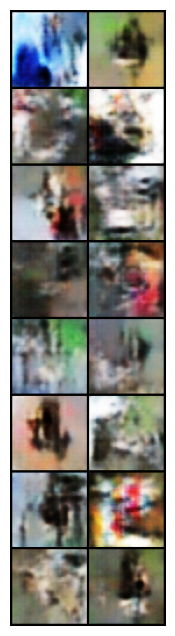

epoch: 4, D_Loss: -0.4797950567491821, G_Loss: -0.04944663721723589, FID: 131.00743103027344
epoch: 5, D_Loss: -0.4573381657185757, G_Loss: -0.0767191191615663, FID: 135.8755340576172
epoch: 6, D_Loss: -0.425839205516879, G_Loss: -0.10864898878420033, FID: 135.34255981445312
epoch: 7, D_Loss: -0.3930632946436363, G_Loss: -0.1395400306641641, FID: 129.77011108398438
epoch: 8, D_Loss: -0.3750719406263296, G_Loss: -0.1581353084627858, FID: 131.5652618408203


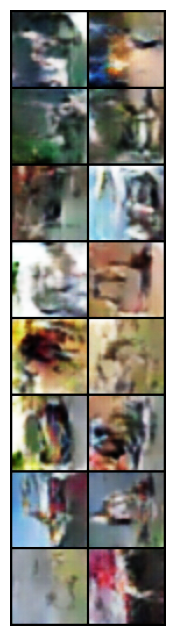

epoch: 9, D_Loss: -0.3593617212284559, G_Loss: -0.1716968042992146, FID: 121.1256332397461
epoch: 10, D_Loss: -0.34294879806925904, G_Loss: -0.1892793738128989, FID: 131.50302124023438
epoch: 11, D_Loss: -0.3278284310837232, G_Loss: -0.20392516009715597, FID: 128.3507537841797
epoch: 12, D_Loss: -0.31367811141416535, G_Loss: -0.22163615022313155, FID: 118.47909545898438
epoch: 13, D_Loss: -0.30193145456521425, G_Loss: -0.2333219724980033, FID: 120.6469955444336


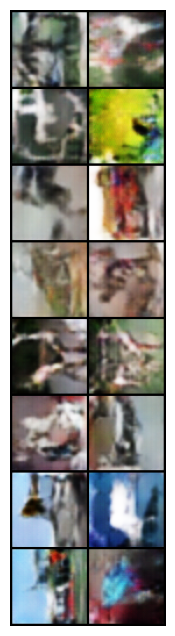

epoch: 14, D_Loss: -0.29191780582718235, G_Loss: -0.24709652454260012, FID: 123.66967010498047
epoch: 15, D_Loss: -0.2909915272232214, G_Loss: -0.25211142870100917, FID: 124.25560760498047
epoch: 16, D_Loss: -0.2935624544272946, G_Loss: -0.25255041530170025, FID: 127.11408233642578
epoch: 17, D_Loss: -0.29851647741959253, G_Loss: -0.25130968149322686, FID: 119.28729248046875
epoch: 18, D_Loss: -0.31647442240849144, G_Loss: -0.2374630593145421, FID: 127.32669067382812


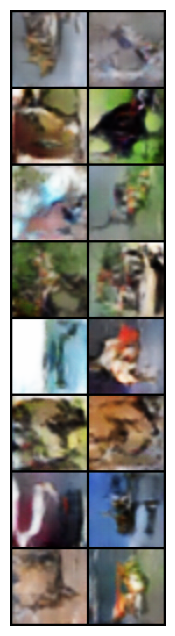

epoch: 19, D_Loss: -0.34370739476760026, G_Loss: -0.21809563798311254, FID: 121.84613037109375
epoch: 20, D_Loss: -0.46103866214642464, G_Loss: -0.132645833749941, FID: 137.3644561767578
epoch: 21, D_Loss: -0.6704119764782891, G_Loss: 0.013413959826209375, FID: 121.18296813964844
epoch: 22, D_Loss: -0.8379163661576303, G_Loss: 0.12443194043485548, FID: 123.78556823730469
epoch: 23, D_Loss: -0.930058027167454, G_Loss: 0.18665493921557788, FID: 134.77281188964844


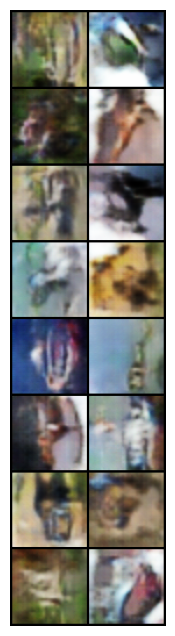

epoch: 24, D_Loss: -0.9742071861729895, G_Loss: 0.22496320720097465, FID: 124.57025146484375
epoch: 25, D_Loss: -0.9948829251405834, G_Loss: 0.24032916569882226, FID: 133.46778869628906
epoch: 26, D_Loss: -1.0287337939757515, G_Loss: 0.2519083109671188, FID: 125.62217712402344
epoch: 27, D_Loss: -1.028632109160619, G_Loss: 0.2629410105163727, FID: 125.70512390136719
epoch: 28, D_Loss: -1.0385841885643536, G_Loss: 0.27139378129445074, FID: 131.66102600097656


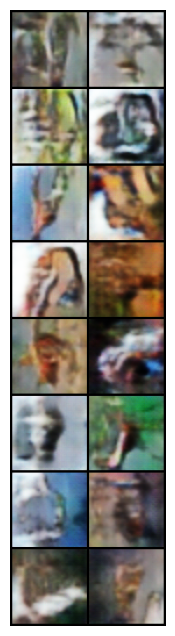

epoch: 29, D_Loss: -1.045446529946364, G_Loss: 0.27092761237202856, FID: 125.32963562011719
epoch: 30, D_Loss: -1.0440373216805707, G_Loss: 0.275031746198397, FID: 127.66011047363281
epoch: 31, D_Loss: -1.0448431776002844, G_Loss: 0.27720472750449293, FID: 128.70382690429688
epoch: 32, D_Loss: -1.0357878158616889, G_Loss: 0.27111347373801253, FID: 130.18087768554688
epoch: 33, D_Loss: -1.015312982825062, G_Loss: 0.2676489897408163, FID: 127.30187225341797


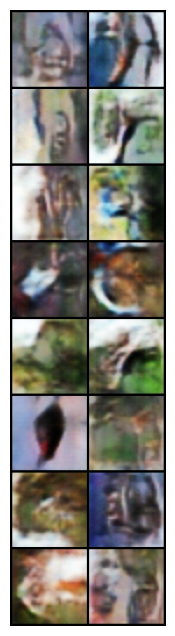

epoch: 34, D_Loss: -1.031352260198129, G_Loss: 0.27471698543695194, FID: 125.32921600341797
epoch: 35, D_Loss: -1.047217623146292, G_Loss: 0.2751511378104196, FID: 127.06779479980469
epoch: 36, D_Loss: -0.9982505457937876, G_Loss: 0.26000704650309825, FID: 118.67137908935547
epoch: 37, D_Loss: -1.008524193407018, G_Loss: 0.24664274932306898, FID: 131.77694702148438
epoch: 38, D_Loss: -1.0223496685628706, G_Loss: 0.2624959406815707, FID: 136.0020294189453


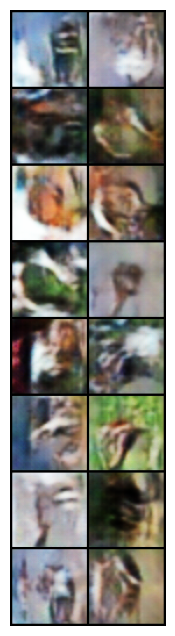

epoch: 39, D_Loss: -1.0029518074544181, G_Loss: 0.26038711311657675, FID: 121.5651626586914
epoch: 40, D_Loss: -0.9811392151638689, G_Loss: 0.24465574441022714, FID: 124.82852935791016
epoch: 41, D_Loss: -1.005066339942196, G_Loss: 0.2569672271306805, FID: 134.3172149658203
epoch: 42, D_Loss: -0.9677229971379581, G_Loss: 0.2410933749763357, FID: 131.74697875976562
epoch: 43, D_Loss: -0.9652530940444881, G_Loss: 0.2478705001929465, FID: 138.68197631835938


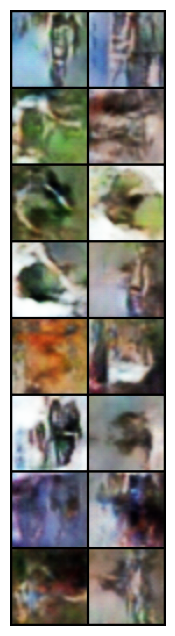

epoch: 44, D_Loss: -0.9745396632520136, G_Loss: 0.24433648221663978, FID: 122.8536605834961
epoch: 45, D_Loss: -0.9593232492809091, G_Loss: 0.23529122250935877, FID: 129.39242553710938
epoch: 46, D_Loss: -0.9692315654071707, G_Loss: 0.2353667080642946, FID: 141.3858642578125
epoch: 47, D_Loss: -0.9495134165677274, G_Loss: 0.23483650519392307, FID: 124.89093780517578
epoch: 48, D_Loss: -0.9381718999284616, G_Loss: 0.22930659664809094, FID: 131.1404266357422


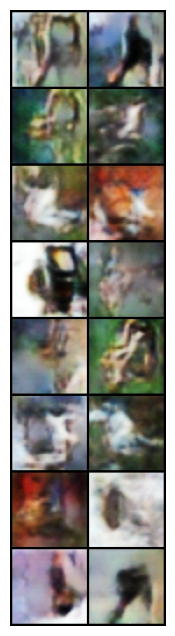

epoch: 49, D_Loss: -0.9318419700693299, G_Loss: 0.2193462089677115, FID: 133.71051025390625


In [11]:
# Training Loop
alld, allg, all_imgs, fids = [],[],[],[]

for epoch in range(epochs):
    d_real_error, g_error, gen_imgs, fid = train(G, D, gen_optimizer, dis_optimizer, train_loader, epoch,clip, n_crit)
    print(f'epoch: {epoch}, D_Loss: {d_real_error}, G_Loss: {g_error}, FID: {fid}')
    alld.append(d_real_error)
    allg.append(g_error)
    all_imgs.extend(gen_imgs)
    fids.append(fid)


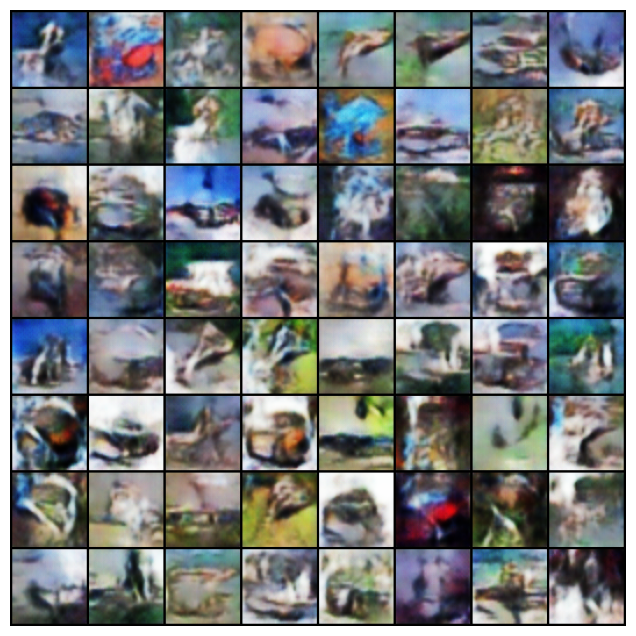

In [12]:
mpl.rcParams['animation.embed_limit'] = 2**128
fig = plt.figure(figsize=(8,8))
plt.axis("off")
image = [[plt.imshow(np.transpose(i.cpu()[:3], (1,2,0)), animated=True)] for i in all_imgs]
#image = [[plt.imshow(i.cpu(), animated=True)] for i in all_imgs]
ani = animation.ArtistAnimation(fig, image, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

In [13]:
len(allg)

50

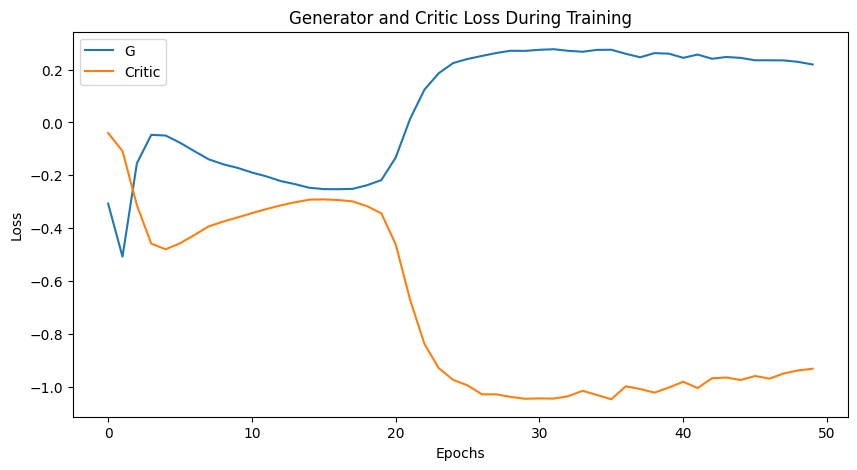

In [14]:
# alliters = list(range(alld))

plt.figure(figsize=(10,5))
plt.title("Generator and Critic Loss During Training")
plt.plot(allg,label="G")
plt.plot(alld,label="Critic")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.legend()
plt.show()

In [15]:
torch.save(G.state_dict(),'wgan_g.pth')
torch.save(D.state_dict(), 'wgan_d.pth')

# dc_gen, dc_dis

torch.Size([1, 100, 1, 1])

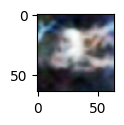

In [16]:
G.eval()
rando_noise = torch.randn(1,100,1,1)
img = G(rando_noise.to(device), data[1][0].to(device))
fig = plt.figure(figsize=(1,1))
plt.imshow(np.transpose(vutils.make_grid(img, padding=2, normalize=True).cpu(), (2,1,0)))
#img.cpu().detach()
#np.transpose(img.detach().cpu(), (1,2,0))
#fixed_noise[0,:].unsqueeze(0).shape
torch.full((1,100,1,1), .75 ).shape

In [17]:
gen_imgs[0].shape

torch.Size([3, 530, 530])

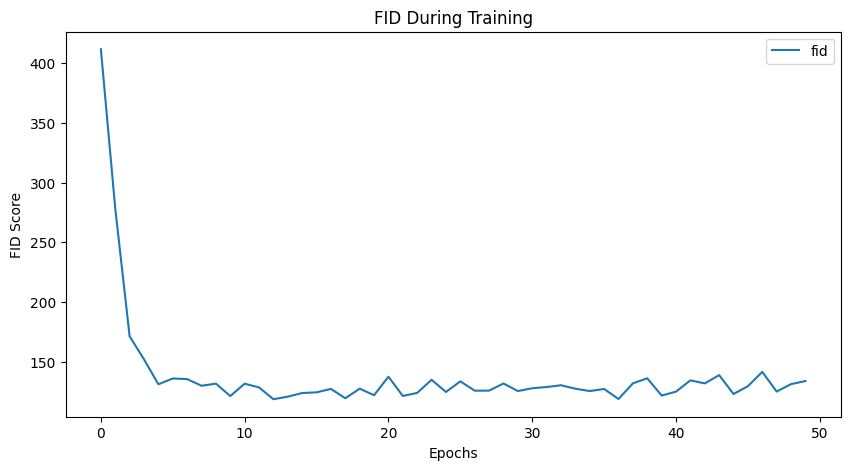

In [18]:
# alliters = list(range(alld))

plt.figure(figsize=(10,5))
plt.title("FID During Training")
plt.plot(fids, label='fid')
plt.xlabel("Epochs")
plt.ylabel("FID Score")
plt.legend()
plt.show()